In [2]:
import polars as pl
import numpy as np
import os
import time
import sys
import dicom2nifti
import shutil
import pydicom


In [7]:
from pathlib import Path

f_dicom_path = Path('/Users/edeneldar/Desktop/dicom/input/')

output_dir = Path('/Users/edeneldar/Desktop/dicom/output/')

ds = pydicom.dcmread(str(f_dicom_path))

AttributeError: module 'pydicom' has no attribute 'read_file'

In [4]:
pulse_tag_1 = (0x0021, 0x1019)


if pulse_tag_1 in ds:
    pulse_data_1 = ds[pulse_tag_1].value
    print(f"Extracted pulse data from tag (0021,1019): {len(pulse_data_1)} bytes")
else:
    print("Pulse data not found in tag (0021,1019)")



# Access the private tag (7FE1,1010)
pulse_tag_2 = (0x7FE1, 0x1010)
if pulse_tag_2 in ds:
    pulse_data_2 = ds[pulse_tag_2].value
    print(f"Extracted pulse data from tag (7FE1,1010): {len(pulse_data_2)} bytes")
else:
    print("Pulse data not found in tag (7FE1,1010)")

Extracted pulse data from tag (0021,1019): 173510 bytes
Extracted pulse data from tag (7FE1,1010): 8949760 bytes


In [5]:
import numpy as np

# Assuming the data is stored as 32-bit floats
# pulse_array = np.frombuffer(pulse_data_1, dtype=np.float32)

# If the data uses a different data type, adjust accordingly
# For example, if it's 16-bit signed integers:
pulse_array = np.frombuffer(pulse_data_1, dtype=np.int16)

pulse_array2 = np.frombuffer(pulse_data_2, dtype=np.int16)
# Now you can process pulse_array as a NumPy array
print(f"Pulse data array shape: {pulse_array.shape}")

Pulse data array shape: (86755,)


In [14]:
import plotly.express as px

pulse_array_sliced = pulse_array[614:52103]

fig = px.line(x=np.arange(len(pulse_array_sliced)), y=pulse_array_sliced)
fig.show()

In [17]:
import numpy as np
import plotly.graph_objects as go

# Compute FFT
fft_result = np.fft.fft(pulse_array_sliced)
fft_freq = np.fft.fftfreq(len(pulse_array_sliced), d=2.0)  # Assuming a sampling interval of 1.0; adjust if known

# Only take the positive half of the spectrum
positive_freqs = fft_freq[:len(fft_freq)//2]
positive_fft = np.abs(fft_result[:len(fft_result)//2])

# Plot the frequency spectrum
fig = go.Figure()
fig.add_trace(go.Scatter(x=positive_freqs, y=positive_fft))

fig.update_layout(
    title="Frequency Spectrum of the Extracted Signal",
    xaxis_title="Frequency (Hz)",
    yaxis_title="Amplitude",
    xaxis=dict(range=[0, 5])  # Focus on frequencies up to 5 Hz
)
fig.show()

In [21]:
import json


json_file = ds.to_json_dict()

with open('data.json', 'w') as f:
    json.dump(json_file, f, indent=4)

In [22]:
txt_file = ds.items()

with open('data.txt', 'w') as f:
    for item in txt_file:
        f.write("%s\n" % item)

TypeError: not all arguments converted during string formatting

In [25]:
for elem in ds:
    print(f"Tag {elem.tag}: {elem.VR}: {elem.name}")

Tag (0008,0005): CS: Specific Character Set
Tag (0008,0008): CS: Image Type
Tag (0008,0012): DA: Instance Creation Date
Tag (0008,0013): TM: Instance Creation Time
Tag (0008,0016): UI: SOP Class UID
Tag (0008,0018): UI: SOP Instance UID
Tag (0008,0020): DA: Study Date
Tag (0008,0021): DA: Series Date
Tag (0008,0022): DA: Acquisition Date
Tag (0008,0023): DA: Content Date
Tag (0008,002A): DT: Acquisition DateTime
Tag (0008,0030): TM: Study Time
Tag (0008,0031): TM: Series Time
Tag (0008,0032): TM: Acquisition Time
Tag (0008,0033): TM: Content Time
Tag (0008,0050): SH: Accession Number
Tag (0008,0060): CS: Modality
Tag (0008,0070): LO: Manufacturer
Tag (0008,0080): LO: Institution Name
Tag (0008,0081): ST: Institution Address
Tag (0008,0090): PN: Referring Physician's Name
Tag (0008,1010): SH: Station Name
Tag (0008,1030): LO: Study Description
Tag (0008,103E): LO: Series Description
Tag (0008,1090): LO: Manufacturer's Model Name
Tag (0008,1111): SQ: Referenced Performed Procedure Step S

In [11]:
import pandas as pd
import unicodedata

def extract_pulse_data(file_path):
    data = []
    with open(file_path, 'r', encoding='ISO-8859-1') as file:
        for line in file:
            if 'PULS' in line:
                parts = line.strip().split()
                if len(parts) >= 3:
                    timestamp = parts[0]
                    pulse_type = parts[1]
                    pulse_value = parts[2]
                    trigger = parts[3] if len(parts) > 3 else None  # Check for presence of trigger
                    data.append([timestamp, pulse_type, pulse_value, trigger])
                
    df = pd.DataFrame(data, columns=['Timestamp', 'Type', 'Pulse', 'Trigger'])
    df['Pulse'] = pd.to_numeric(df['Pulse'], errors='coerce')  # Convert the pulse values to numeric, ignore errors
    return df

# Usage

# Usage
file_path = '/Users/edeneldar/Desktop/dicom/#UH_425-22_NRU0.MR.NRU003_425-22_A.16.1.2024.09.15.14.47.36.699.59296936.txt'  # Replace this with the path to your text file
pulse_data = extract_pulse_data(file_path)
df = pl.DataFrame(pulse_data)

df.write_parquet('pulse_data.parquet')
print(pulse_data.head())  # Print the first few rows to verify

                             Timestamp Type  Pulse Trigger
0  sTXSPEC.aRFPULSE.__attribute__.size    =  256.0    None
1            sTXSPEC.aRFPULSE[0].tName    =    NaN    None
2            sTXSPEC.aRFPULSE[1].tName    =    NaN    None
3            sTXSPEC.aRFPULSE[2].tName    =    NaN    None
4            sTXSPEC.aRFPULSE[3].tName    =    NaN    None


In [8]:
import pandas as pd

# Load the data
file_path = '/Users/edeneldar/Library/Mobile Documents/com~apple~CloudDocs/dicom/pulse_data.csv'  # Adjust the path to your file
pulse_data = pd.read_csv(file_path, header=0)

pulse_data = pulse_data[10:]

pulse_data

# Ensure the timestamp column is in datetime format
pulse_data['Timestamp'] = pd.to_datetime(pulse_data['Timestamp'])

# Calculate differences between consecutive timestamps
pulse_data['Time_Diff'] = pulse_data['Timestamp'].diff().dt.total_seconds()  # Difference in seconds

# Find the most common time difference
common_interval = pulse_data['Time_Diff'].mode()[0]

# Calculate the sampling rate (in Hz)
sampling_rate = 1 / common_interval if common_interval > 0 else None

print(f"The most common sampling interval is {common_interval} seconds.")
print(f"The estimated sampling rate is {sampling_rate} Hz.")

ValueError: day is out of range for month, at position 8. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

In [4]:
import os
from zlib import decompressobj, MAX_WBITS
import pydicom
from lxml import etree



dicom_path = '/Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.16.1.2024.09.15.14.47.36.699.59296936.dcm'

In [3]:
import pydicom
import gdcm
import os
from zlib import decompressobj, MAX_WBITS
import pydicom
from lxml import etree



def decompress_pmu(pmucomp):
    # Decompress the physiological data from the DICOM file
    CHUNKSIZE = min(1024, len(pmucomp))
    d = decompressobj(16 + MAX_WBITS)

    physiodecompchunks = []
    for startidx in range(0, len(pmucomp), CHUNKSIZE):
        buffer = pmucomp[startidx:startidx + CHUNKSIZE]
        chunk = d.decompress(buffer)
        physiodecompchunks.append(chunk.decode('ascii'))

    return ''.join(physiodecompchunks)

def apply_xsl(pmuxml, xslt_file):
    # Apply the XSL transformation to the decompressed XML data
    print(f"*** Applying style file: {xslt_file} ***")
    
    if not os.path.isfile(xslt_file):
        raise FileNotFoundError(f"Style file does not exist: {xslt_file}")
    xsl_path_folder = '/Users/edeneldar/Desktop/dicom/physio_styles/'

    for file in os.listdir(xsl_path_folder):
        xslt_file = os.path.join(xsl_path_folder, file)


        xsl = open(xslt_file, 'r').read()
        xslt_root = etree.XML(xsl)
        transform = etree.XSLT(xslt_root)

        try:
            result = transform(etree.XML(str.encode(pmuxml)))
            print(f"*** Transformation complete ***\n{str(result)}")
            print(f"*** xslt file: {xslt_file} ***")
            break
        except:
            print(f"*** xslt file: {xslt_file} not good ***")
            continue
        


    xsl = open(xslt_file, 'r').read()
    xslt_root = etree.XML(xsl)
    transform = etree.XSLT(xslt_root)

    result = transform(etree.XML(str.encode(pmuxml)))
    # print(f"*** Transformation complete ***\n{str(result)}")
    
    return str(result)

def extract_physio_from_dicom(dicom_file, xslt_file, output_dir):
    if not os.path.isfile(dicom_file):
        raise FileNotFoundError(f"DICOM file does not exist: {dicom_file}")

    if not os.path.isdir(output_dir):
        os.mkdir(output_dir)

    # Read the DICOM file
    pmudicom = pydicom.dcmread(dicom_file)
    # print(pmudicom[0x7FE1, 0x1010].value[:10])  # Print the first 10 bytes of the data
    # Check for the appropriate DICOM tags and extract the compressed data
    if (0x7FE00010 in pmudicom):
        pmuxml = decompress_pmu(pmudicom[0x7FE0, 0x0010].value)
    elif (0x7FE11010 in pmudicom):
        pmuxml = decompress_with_gdcm(dicom_file)

        # pmuxml = decompress_pmu(pmudicom[0x7FE1, 0x1010].value)
    else:
        raise ValueError("Non-image DICOM content not present. Unable to find the required DICOM tags.")

    # Apply the XSL transformation and save the output
    transformed_data = apply_xsl(pmuxml, xslt_file)

    # Save the transformed result to a file
    output_filename = os.path.join(output_dir, os.path.basename(dicom_file).replace('.dcm', '_physio.txt'))
    with open(output_filename, 'w') as f:
        f.write(transformed_data)

    # print(f"Physiological data extracted and saved to {output_filename}")


def decompress_with_gdcm(dicom_file):
    # Read the DICOM file using pydicom
    ds = pydicom.dcmread(dicom_file)
    
    # Ensure the data is decompressed using GDCM if compressed
    ds.decompress('gdcm')
    
    # Access the binary data after decompression
    return ds[0x7FE1, 0x1010].value
def extract_physio_from_dicom(dicom_file, xslt_file, output_dir):
    if not os.path.isfile(dicom_file):
        raise FileNotFoundError(f"DICOM file does not exist: {dicom_file}")

    if not os.path.isdir(output_dir):
        os.mkdir(output_dir)

    # Read the DICOM file
    pmudicom = pydicom.dcmread(dicom_file)

    # Access the non-image data tags (without decoding as ASCII initially)
    if (0x7FE00010 in pmudicom):
        pmuxml = pmudicom[0x7FE0, 0x0010].value  # Treat as binary
    elif (0x7FE11010 in pmudicom):
        pmuxml = pmudicom[0x7FE1, 0x1010].value  # Treat as binary
    else:
        raise ValueError("Non-image DICOM content not present. Unable to find the required DICOM tags.")

    # for key in pmudicom.keys():
    #     try:
    #         print((pmudicom[key].value).decode('ascii', errors='ignore').strip('\x00'))
    #         print(f'The key of this magic is {key}')
    #     except:
    #         continue
    # Try to decode the binary data into a string, skipping null bytes and handling errors
    try:
        # print(f"pmuxml dtype: {type(pmuxml)}")
        pmuxml_str = pmuxml.decode('ascii', errors='ignore').strip('\x00')
        # print(f"Decoded data (first 100 characters): {pmuxml_str}")
    except UnicodeDecodeError as e:
        print(f"Decoding error: {e}")
        return

    # Apply the XSL transformation using the decoded string
    transformed_data = apply_xsl(pmuxml_str, xslt_file)

    # Save the transformed result to a file
    output_filename = os.path.join(output_dir, os.path.basename(dicom_file).replace('.dcm', '_physio.txt'))
    with open(output_filename, 'w') as f:
        f.write(transformed_data)

    # print(f"Physiological data extracted and saved to {output_filename}")
# Example usage:
dicom_file = '/Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.16.1.2024.09.15.14.47.36.699.59296936.dcm'
xslt_file = '/Users/edeneldar/Desktop/dicom/physio_styles/Style_ECG4.xsl'
output_dir = '/Users/edeneldar/Desktop/dicom/output'

# extract_physio_from_dicom(dicom_file, xslt_file, output_dir)
extract_physio_from_dicom(dicom_file, xslt_file, output_dir)

*** Applying style file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_ECG4.xsl ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_ECG4.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_ECG1.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_PhysioTriggertimes.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_ECG3.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_ECG2.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_EXT2.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_AcquisitionInfo.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_EXT1.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_PULS.xsl not good ***
*** xslt file: /Users/edeneldar/Desktop/dicom/physio_styles/Style_PT_R.xsl not good ***
*** xs

XMLSyntaxError: Start tag expected, '<' not found, line 1, column 1 (<string>, line 1)

In [31]:
dfile = pydicom.dcmread(dicom_file)

dfile.keys()


dict_keys([(0008,0005), (0008,0008), (0008,0012), (0008,0013), (0008,0016), (0008,0018), (0008,0020), (0008,0021), (0008,0022), (0008,0023), (0008,002A), (0008,0030), (0008,0031), (0008,0032), (0008,0033), (0008,0050), (0008,0060), (0008,0070), (0008,0080), (0008,0081), (0008,0090), (0008,1010), (0008,1030), (0008,103E), (0008,1090), (0008,1111), (0008,9123), (0009,0010), (0009,108C), (0010,0010), (0010,0020), (0010,0021), (0010,0030), (0010,0040), (0010,1010), (0010,1020), (0010,1030), (0010,2000), (0010,2110), (0012,0062), (0018,0015), (0018,0050), (0018,0080), (0018,0081), (0018,0084), (0018,0086), (0018,1000), (0018,1020), (0018,1030), (0018,1314), (0018,1316), (0018,1318), (0018,1320), (0018,5100), (0018,9004), (0020,000D), (0020,000E), (0020,0010), (0020,0011), (0020,0012), (0020,0013), (0020,0052), (0020,1040), (0021,0010), (0021,0011), (0021,0012), (0021,1001), (0021,1004), (0021,1006), (0021,1009), (0021,100A), (0021,100C), (0021,100D), (0021,100F), (0021,1010), (0021,1011), (

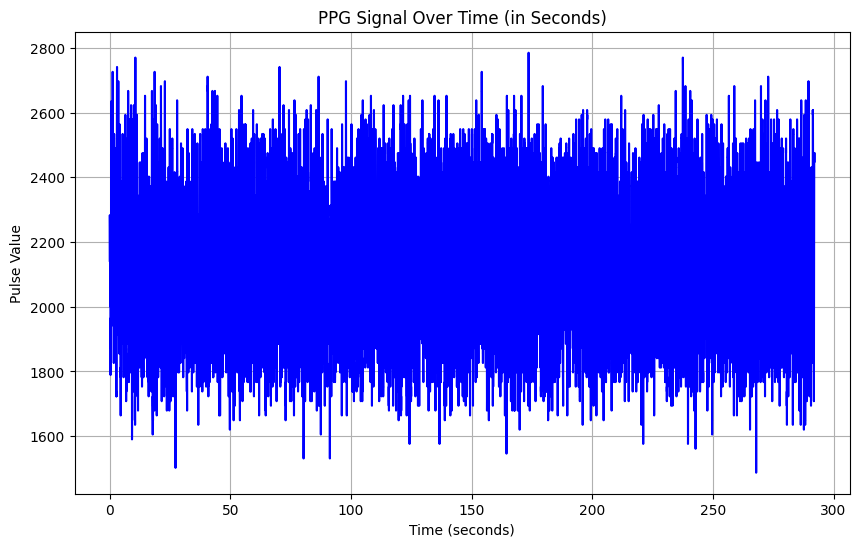

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

# File path to the PULS log file
file_path = '/Users/edeneldar/Desktop/dicom/output/Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_PULS.log'

# Read the file content
with open(file_path, 'r') as file:
    lines = file.readlines()

# Extract the data starting after the metadata
data = []
for line in lines[8:]:  # Skipping the metadata lines
    parts = line.split()
    if len(parts) == 3:  # Ensure it's a valid data line
        data.append([int(parts[0]), int(parts[2])])

# Convert to a DataFrame
df = pd.DataFrame(data, columns=['ACQ_TIME_TICS', 'PULSE_VALUE'])

df['ACQ_TIME_TICS'] = [x - df['ACQ_TIME_TICS'].min() for x in df['ACQ_TIME_TICS']]

# Convert ACQ_TIME_TICS to seconds (each tick represents 2 milliseconds)
df['TIME_IN_SECONDS'] = df['ACQ_TIME_TICS'] * 0.002

# Plot the pulse data
plt.figure(figsize=(10, 6))
plt.plot(df['TIME_IN_SECONDS'], df['PULSE_VALUE'], color='blue')
plt.title('PPG Signal Over Time (in Seconds)')
plt.xlabel('Time (seconds)')
plt.ylabel('Pulse Value')
plt.grid(True)
plt.show()

# Plot the pulse data using Plotly
fig = px.line(df, x='TIME_IN_SECONDS', y='PULSE_VALUE', title='PPG Signal Over Time (in Seconds)')
fig.update_xaxes(title_text='Time (seconds)')
fig.update_yaxes(title_text='Pulse Value')
fig.show()


In [3]:
import subprocess
import os
import platform


script_path = '/Users/edeneldar/Desktop/dicom/phisExtrector2.py'

input_file_path = '/Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.24.1.2024.09.15.14.47.36.699.59296958.dcm'

output_dir = '/Users/edeneldar/Desktop/dicom/output'

command = f'python {script_path} {input_file_path} -o {output_dir}'

# Execute the command
subprocess.run(command, shell=True)

2024-10-08 10:38:49 - readCMRRPhysio - INFO Reading physio DICOM file: /Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.24.1.2024.09.15.14.47.36.699.59296958.dcm
2024-10-08 10:38:49 - readCMRRPhysio - WARNING Unsupported manufacturer: 'Siemens Healthineers', this function is designed for SIEMENS advanced physiological logging data
2024-10-08 10:38:49 - readCMRRPhysio - INFO Decoded: Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_ECG.log
2024-10-08 10:38:49 - readCMRRPhysio - INFO Writing physio data to: /Users/edeneldar/Desktop/dicom/output/Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_ECG.log
2024-10-08 10:38:49 - readCMRRPhysio - INFO Decoded: Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_PULS.log
2024-10-08 10:38:49 - readCMRRPhysio - INFO Writing physio data to: /Users/edeneldar/Desktop/dicom/output/Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_PULS.log
2024-10-08 10:38:49 - readCMRRPhysio - INFO Decoded:

Figure(640x480)


CompletedProcess(args='python /Users/edeneldar/Desktop/dicom/phisExtrector2.py /Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.24.1.2024.09.15.14.47.36.699.59296958.dcm -o /Users/edeneldar/Desktop/dicom/output', returncode=0)

In [4]:
import pydicom

# Load the DICOM file
dicom_file = pydicom.dcmread(input_file_path)


In [26]:
dicom_file2 = pydicom.dcmread('/Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.20.1.2024.09.15.14.47.36.699.59296947.dcm')

dicom_file2

Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 186
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: Raw Data Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.3.12.2.1107.5.2.50.176535.2024091514215397354472590
(0002,0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.3.12.2.1107.5.2
(0002,0013) Implementation Version Name         SH: 'SYNGO_MR_XA31A'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'OTHER', 'NONE']
(0008,0012) Instance Creation Date              DA: '20240915'
(0008,0013) Instance Creation Time              TM: '142154.138000'
(0008,0016) SOP Class UID                       UI: Raw Data Storage
(0008,0018) SOP Instance UID  

In [21]:
sub_name = dicom_file.get(0x00100020).value
task = dicom_file.get(0x00181030).value

In [22]:
if 'rest' in task.lower():
    task = 'Resting State'
elif 'reward' in task.lower():
    task = 'Reward'
elif 'flare' in task.lower():
    task = 'Flares'
else:
    task = 'Unknown'

print(f"Subject Name: {sub_name}")
print(f"Task: {task}")



Subject Name: sub-809
Task: Resting State


In [47]:
import os
import shutil
import polars as pl

input_dir = '/Users/edeneldar/Desktop/dicom/input'
output_dir = '/Users/edeneldar/Desktop/dicom/output'

for file in os.listdir(input_dir):
    dicom_file = pydicom.dcmread(os.path.join(input_dir, file))
    if file.endswith('.dcm'):
        sub_name = dicom_file.get(0x00100020).value
        task = dicom_file.get(0x0008103E).value

        if 'rest' in task.lower():
            task = 'Resting State'
        elif 'reward' in task.lower():
            task = 'Reward'
        elif 'flare' in task.lower():
            task = 'Flares'
        else:
            task = 'Unknown'
            

        file_path = os.path.join(input_dir, file)
        output_path = output_dir
        command = f'python {script_path} {file_path} -o {output_path}'
        subprocess.run(command, shell=True)

        # Change the output file name
        for logfile in os.listdir(output_dir):
            if logfile.endswith('.log'):
                if not 'Physio' in logfile:
                    continue
                
                if 'ECG' in logfile.upper():
                    new_logfile = f"{sub_name}_{task}_ECG.log"

                elif 'PULS' in logfile.upper():
                    new_logfile = f"{sub_name}_{task}_PULS.log"
                elif 'RESP' in logfile.upper():
                    new_logfile = f"{sub_name}_{task}_RESP.log"
                elif 'info' in logfile.lower():
                    new_logfile = f"{sub_name}_{task}_info.log"

                shutil.move(os.path.join(output_dir, logfile), os.path.join(output_dir, new_logfile))
                print(f"Renamed {logfile} to {new_logfile}")

        # Convert the log files to Parquet
        for logfile in os.listdir(output_dir):
            if not logfile.endswith('.log'):
                continue
            with open(os.path.join(output_dir, logfile), 'r') as f:
                lines = f.readlines()


            if 'PULS' in logfile.upper():
                data = []
                time_col = []
                pulse_col = []
                triger_col = []

                for line in lines[8:]:
                    parts = line.strip().split()
                    time_col.append(int(parts[0]))
                    pulse_col.append(int(parts[2]))
                    triger_col.append(0 if len(parts) < 4 else 1)

                task = logfile.split('_')[1].split('_')[0]

                df = pl.DataFrame({
                    'Time': time_col,
                    'value': pulse_col,
                    'trigger': triger_col
                })
                # PULS have a sampling rate of 200 Hz
                df = (
                    df
                    .with_columns(
                        Time = pl.col('Time') - pl.col('Time').min()
                    )
                    .with_columns(
                        Time = pl.col('Time') * 0.0025
                    )
                )

                df.write_parquet(os.path.join(output_dir, f"{sub_name}_{task}_PULS.parquet"))

            elif 'RESP' in logfile.upper():

                data = []
                time_col = []
                resp_col = []
                triger_col = []

                task = logfile.split('_')[1].split('_')[0]
                for line in lines[8:]:
                    parts = line.strip().split()
                    time_col.append(int(parts[0]))
                    resp_col.append(int(parts[2]))
                    triger_col.append(0 if len(parts) < 4 else 1)

                df = pl.DataFrame({
                    'Time': time_col,
                    'value': resp_col,
                    'trigger': triger_col
                })

                # RESP have sampling rate of 50 Hz
                df = (
                    df
                    .with_columns(
                        Time = pl.col('Time') - pl.col('Time').min()
                    )
                    .with_columns(
                        Time = pl.col('Time') * 0.0025
                    )
                )

                df.write_parquet(os.path.join(output_dir, f"{sub_name}_{task}_RESP.parquet"))








2024-10-08 12:10:48 - readCMRRPhysio - INFO Reading physio DICOM file: /Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.20.1.2024.09.15.14.47.36.699.59296947.dcm
2024-10-08 12:10:48 - readCMRRPhysio - WARNING Unsupported manufacturer: 'Siemens Healthineers', this function is designed for SIEMENS advanced physiological logging data
2024-10-08 12:10:48 - readCMRRPhysio - INFO Decoded: Physio_20240915_141227_fd2b067e-fbf8-4d99-b0b4-e36e50ae9907_ECG.log
2024-10-08 12:10:48 - readCMRRPhysio - INFO Writing physio data to: /Users/edeneldar/Desktop/dicom/output/Physio_20240915_141227_fd2b067e-fbf8-4d99-b0b4-e36e50ae9907_ECG.log
2024-10-08 12:10:48 - readCMRRPhysio - INFO Decoded: Physio_20240915_141227_fd2b067e-fbf8-4d99-b0b4-e36e50ae9907_PULS.log
2024-10-08 12:10:48 - readCMRRPhysio - INFO Writing physio data to: /Users/edeneldar/Desktop/dicom/output/Physio_20240915_141227_fd2b067e-fbf8-4d99-b0b4-e36e50ae9907_PULS.log
2024-10-08 12:10:48 - readCMRRPhysio - INFO Decoded:

Figure(640x480)
Renamed Physio_20240915_141227_fd2b067e-fbf8-4d99-b0b4-e36e50ae9907_Info.log to sub-809_Flares_info.log
Renamed Physio_20240915_141227_fd2b067e-fbf8-4d99-b0b4-e36e50ae9907_PULS.log to sub-809_Flares_PULS.log
Renamed Physio_20240915_141227_fd2b067e-fbf8-4d99-b0b4-e36e50ae9907_RESP.log to sub-809_Flares_RESP.log
Renamed Physio_20240915_141227_fd2b067e-fbf8-4d99-b0b4-e36e50ae9907_ECG.log to sub-809_Flares_ECG.log


2024-10-08 12:10:50 - readCMRRPhysio - INFO Reading physio DICOM file: /Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.24.1.2024.09.15.14.47.36.699.59296958.dcm
2024-10-08 12:10:50 - readCMRRPhysio - WARNING Unsupported manufacturer: 'Siemens Healthineers', this function is designed for SIEMENS advanced physiological logging data
2024-10-08 12:10:50 - readCMRRPhysio - INFO Decoded: Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_ECG.log
2024-10-08 12:10:50 - readCMRRPhysio - INFO Writing physio data to: /Users/edeneldar/Desktop/dicom/output/Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_ECG.log
2024-10-08 12:10:50 - readCMRRPhysio - INFO Decoded: Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_PULS.log
2024-10-08 12:10:50 - readCMRRPhysio - INFO Writing physio data to: /Users/edeneldar/Desktop/dicom/output/Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_PULS.log
2024-10-08 12:10:50 - readCMRRPhysio - INFO Decoded:

Figure(640x480)
Renamed Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_RESP.log to sub-809_Resting State_RESP.log
Renamed Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_ECG.log to sub-809_Resting State_ECG.log
Renamed Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_PULS.log to sub-809_Resting State_PULS.log
Renamed Physio_20240915_142332_f318bdec-c973-4a03-ae2f-381d05d8a325_Info.log to sub-809_Resting State_info.log


2024-10-08 12:10:51 - readCMRRPhysio - INFO Reading physio DICOM file: /Users/edeneldar/Desktop/dicom/input/#UH_425-22_NRU0.MR.NRU003_425-22_A.16.1.2024.09.15.14.47.36.699.59296936.dcm
2024-10-08 12:10:51 - readCMRRPhysio - WARNING Unsupported manufacturer: 'Siemens Healthineers', this function is designed for SIEMENS advanced physiological logging data
2024-10-08 12:10:51 - readCMRRPhysio - INFO Decoded: Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_ECG.log
2024-10-08 12:10:51 - readCMRRPhysio - INFO Writing physio data to: /Users/edeneldar/Desktop/dicom/output/Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_ECG.log
2024-10-08 12:10:51 - readCMRRPhysio - INFO Decoded: Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_PULS.log
2024-10-08 12:10:51 - readCMRRPhysio - INFO Writing physio data to: /Users/edeneldar/Desktop/dicom/output/Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_PULS.log
2024-10-08 12:10:51 - readCMRRPhysio - INFO Decoded:

Figure(640x480)
Renamed Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_ECG.log to sub-809_Reward_ECG.log
Renamed Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_PULS.log to sub-809_Reward_PULS.log
Renamed Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_Info.log to sub-809_Reward_info.log
Renamed Physio_20240915_140321_fd9a3a45-96e6-41a9-b8de-f65a3629399f_RESP.log to sub-809_Reward_RESP.log


In [5]:
import neurokit2 as nk
import polars as pl
import bidsphysio as bp

puls_file = '/Users/edeneldar/Desktop/dicom/output/sub-809_Flares_PULS.parquet'

resp_file = '/Users/edeneldar/Desktop/dicom/output/sub-809_Flares_RESP.parquet'

output_dir = '/Users/edeneldar/Desktop/dicom/output'

puls_data = pl.read_parquet(puls_file)
resp_data = pl.read_parquet(resp_file)


ppg, info = nk.ppg_process(puls_data.to_pandas()['value'], sampling_rate=200)

respiratory, info = nk.rsp_process(resp_data.to_pandas()['value'], sampling_rate=50)

# nk.ppg_intervalrelated(ppg, sampling_rate=200)

nk.rsp_intervalrelated(respiratory, sampling_rate=50)

,RSP_Rate_Mean,RRV_RMSSD,RRV_MeanBB,RRV_SDBB,RRV_SDSD,RRV_CVBB,RRV_CVSD,RRV_MedianBB,RRV_MadBB,RRV_MCVBB,...,RAV_Mean,RAV_SD,RAV_RMSSD,RAV_CVSD,RSP_RVT,RSP_Symmetry_PeakTrough,RSP_Symmetry_RiseDecay,RSP_Phase_Duration_Inspiration,RSP_Phase_Duration_Expiration,RSP_Phase_Duration_Ratio
0,19.346114,656.471672,3112.067039,594.591424,658.323259,0.19106,0.210944,3040.0,326.172,0.107293,...,1293.851421,428.90232,544.378034,0.420742,393.441504,0.641019,0.447107,1.363667,1.706592,0.799058


In [28]:
from bidsphysio.pmu2bids import pmu2bidsphysio

puls_pmu = '/Users/edeneldar/Desktop/dicom/old_files/#425-22_sub_406_rs.puls'
resp_pmu = '/Users/edeneldar/Desktop/dicom/old_files/#UH_425_22_NRU003_sub_442_rsFMRI.resp'

pmu = pmu2bidsphysio.readpmu(puls_pmu)

pmu_resp = pmu2bidsphysio.readpmu(resp_pmu)

signal = pmu[3]

resp_signal = pmu_resp[3]

sampling_rate = 200

sampling_rate_resp = 50

ppg, info = nk.ppg_process(signal, sampling_rate=sampling_rate)



Unknown type of recording for /Users/edeneldar/Desktop/dicom/old_files/#UH_425_22_NRU003_sub_442_rsFMRI.resp


ValueError: invalid literal for int() with base 10: ''

In [21]:
import plotly.express as px
import numpy as np

fig = px.line(x=np.arange(len(ppg)), y=ppg['PPG_Clean'])
fig.show()

In [52]:
data = nk.data("bio_resting_5min_100hz")

# Process the data
df, info = nk.rsp_process(data["RSP"], sampling_rate=100)

# Single dataframe is passed
nk.rsp_intervalrelated(df, sampling_rate=100)

,RSP_Rate_Mean,RRV_RMSSD,RRV_MeanBB,RRV_SDBB,RRV_SDSD,RRV_CVBB,RRV_CVSD,RRV_MedianBB,RRV_MadBB,RRV_MCVBB,...,RAV_Mean,RAV_SD,RAV_RMSSD,RAV_CVSD,RSP_RVT,RSP_Symmetry_PeakTrough,RSP_Symmetry_RiseDecay,RSP_Phase_Duration_Inspiration,RSP_Phase_Duration_Expiration,RSP_Phase_Duration_Ratio
0,15.860331,1346.511047,3840.394737,1020.640898,1355.513426,0.265765,0.350618,3605.0,511.497,0.141885,...,0.386252,0.201938,0.240509,0.622674,0.093298,0.617104,0.3989,1.524286,2.293947,0.664482


In [79]:
import fmri_physio_log as fpl


resp_file = '/Users/edeneldar/Desktop/dicom/old_files/#UH_425-22_NRU003_sub_545_Task_Reward.resp'
puls_file = '/Users/edeneldar/Desktop/dicom/old_files/#UH_425-22_NRU003_sub_545_Task_Flares.puls'



with open(resp_file, 'rb') as f:
    resp_str = f.read()

with open(puls_file, 'rb') as f:
    puls_str = f.read()

resp_str = resp_str.decode('utf-8')
puls_str = puls_str.decode('utf-8')

with open('resp2.txt', 'w') as f:
    f.write(resp_str)

with open('puls2.txt', 'w') as f:
    f.write(puls_str)


resp_data = fpl.PhysioLog.from_string(resp_str)
puls_data = fpl.PhysioLog.from_string(puls_str)

In [81]:
import re
import pandas as pd

# Load respiratory data
with open('resp2.txt', 'r') as file:
    lines = file.readlines()

resp_data = []
for line in lines:
    # Using regular expression to find numerical sequences
    numeric_values = re.findall(r'\b\d+\b', line)
    if numeric_values:
        # Convert numeric values to integers
        numeric_values = list(map(int, numeric_values))
        # Assuming actual signal values start after some metadata, filter accordingly
        if len(numeric_values) > 5:  # This helps filter out metadata lines
            resp_data.extend(numeric_values[4:])  # Skip the metadata parts, assume signal starts at index 4

# Convert to Pandas DataFrame for easier handling
resp_df = pd.DataFrame(resp_data, columns=['Respiratory Signal'])
print(resp_df[:100])

# Repeat similar process for pulse data
with open('puls2.txt', 'r') as file:
    lines = file.readlines()

pulse_data = []
for line in lines:
    numeric_values = re.findall(r'\b\d+\b', line)
    if numeric_values:
        numeric_values = list(map(int, numeric_values))
        if len(numeric_values) > 5:  # Again, filter out metadata lines
            pulse_data.extend(numeric_values[4:])  # Skip the metadata parts, assume signal starts at index 4

pulse_df = pd.DataFrame(pulse_data, columns=['Pulse Signal'])
print(pulse_df)


    Respiratory Signal
0                 5002
1                    3
2                 6002
3                 5002
4                    1
..                 ...
95                2048
96            37941182
97               99223
98            67108864
99              163840

[100 rows x 1 columns]
        Pulse Signal
0               5002
1                  1
2               6002
3               2534
4               2520
...              ...
120367          2136
120368          2136
120369          2121
120370          2107
120371          5003

[120372 rows x 1 columns]


/var/folders/5g/7gzv8rg14tv7prkqk0v2f3280000gn/T/ipykernel_27404/3470585059.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_resp_df['Smoothed Signal'] = filtered_resp_df['Respiratory Signal'].rolling(window=10, min_periods=1).mean()


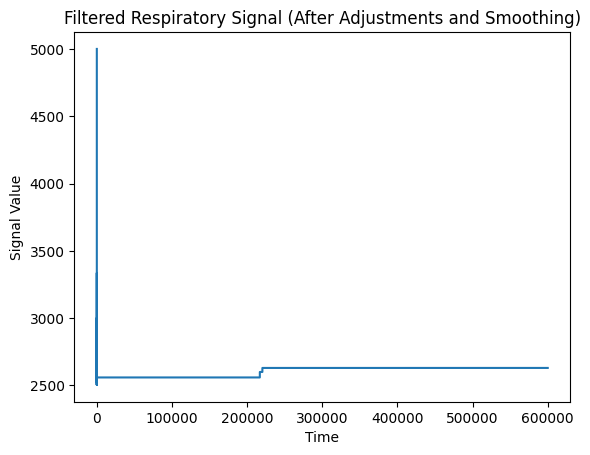

       Respiratory Signal  Smoothed Signal
count           15.000000        15.000000
mean          2752.933333      2841.607910
std           2491.759461       640.735328
min              1.000000      2502.000000
25%            201.500000      2539.612500
50%           5002.000000      2598.400000
75%           5002.000000      2835.396825
max           5003.000000      5002.000000


In [87]:
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load respiratory data
with open('resp2.txt', 'r') as file:
    lines = file.readlines()

resp_data = []
for line in lines:
    numeric_values = re.findall(r'\b\d+\b', line)
    if numeric_values:
        numeric_values = list(map(int, numeric_values))
        if len(numeric_values) > 5:  # Filter out metadata lines
            filtered_values = numeric_values[4:]  # Skip metadata parts
            if filtered_values:
                resp_data.extend(filtered_values)

# Convert to Pandas DataFrame
resp_df = pd.DataFrame(resp_data, columns=['Respiratory Signal'])

# Adjust the filter criteria to retain more values
filtered_resp_df = resp_df[(resp_df['Respiratory Signal'] != 2048) &
                           (resp_df['Respiratory Signal'] != 5000) &
                           (resp_df['Respiratory Signal'] != 6002) &
                           (resp_df['Respiratory Signal'] < 10000)]

# Apply a moving average with a smaller window to smooth the signal
filtered_resp_df['Smoothed Signal'] = filtered_resp_df['Respiratory Signal'].rolling(window=10, min_periods=1).mean()

# Plot the filtered and smoothed respiratory signal
plt.figure()
plt.plot(filtered_resp_df['Smoothed Signal'])
plt.title('Filtered Respiratory Signal (After Adjustments and Smoothing)')
plt.xlabel('Time')
plt.ylabel('Signal Value')
plt.show()

# Summary statistics to inspect the distribution after filtering
print(filtered_resp_df.describe())


In [68]:
from __future__ import division, print_function

from scipy.interpolate import interp1d
import os

import dicom as pdcm
from glob import glob
from os.path import join as pjoin

/opt/anaconda3/envs/new_base/lib/python3.11/site-packages/dicom/__init__.py:53: UserWarning: 
This code is using an older version of pydicom, which is no longer 
maintained as of Jan 2017.  You can access the new pydicom features and API 
by installing `pydicom` from PyPI.
See 'Transitioning to pydicom 1.x' section at pydicom.readthedocs.org 
for more information.

  warnings.warn(msg)


In [69]:
#
# Low level read of Siemens Physiological Log files
#
def read_log(fnameorfilelike, debug=False):
    '''
    Read a Siemens Physiological Log file. Returns a tuple
    with the logging data as numpy integer array and times
    in the form of milliseconds past midnight.

    Parameters
    ----------
    fnameorfilelike : srt or file object
        a file name to open or an already opened file-like object

    Returns
    -------
    tuple :
        data_trimmed
        start_time_mdh
        stop_time_mdh
        start_time_mpcu
        stop_time_mpcu
    '''
    f = None
    try:
        f = fnameorfilelike if hasattr(fnameorfilelike, 'read') else open(fnameorfilelike)
        lines = [line for line in f]
    finally:
        if f:
            f.close()
    
    # Most values are space separated on a single (the first) line
    fields = lines[0].split(' ')
    method    = fields[0] # typically 1 = None
    arrythmia = fields[1] # typically 2 = TimeBased
    signal    = fields[2] # typically 20 = Respiratory/Pulse
    gate_open = fields[3] # typically 2
    gate_closed = fields[4] # possibly missing field on respiratory traces
    
    if debug:
        print(fields[:40])
        print('method    =', method)
        print('arrythmia =', arrythmia)
        print('signal    =', signal)
        print('gate_open =', gate_open)
        print('gate_closed =', gate_closed)

    if int(fields[5]) < 5002:
        # non cardiac gate close seems to be missing
        clean_fields = [fields[4]]
    else:
        # cardiac has gate closed and 5002 info field
        clean_fields = []
        
    # Remove anything bracketed by 5002, 6002 (Information Fields)
    include = True
    ninfos = 0
    for field in fields[5:]:
        if include:
            if field == '5002':
                include = False
                excluded = []
            else:
                clean_fields.append(field)
        else:
            if field == '6002':
                include = True
                if debug:
                    print("Excluded info field: '%s'" % ' '.join(excluded))
                    ninfos += 1
            else:
                excluded.append(field)

    # Drop the '6003\r\n' at the end
    clean_fields = clean_fields[:-1]

    # Returned values will be a numpy array of ints
    data = asarray([int(field) for field in clean_fields])

    # Extract the start/stop times from subsequent lines
    start_time_mdh  = int([line for line in lines if line.startswith('LogStartMDHTime')][0].split()[1])
    stop_time_mdh   = int([line for line in lines if line.startswith('LogStopMDHTime')][0].split()[1])
    start_time_mpcu = int([line for line in lines if line.startswith('LogStartMPCUTime')][0].split()[1])
    stop_time_mpcu  = int([line for line in lines if line.startswith('LogStopMPCUTime')][0].split()[1])

    if debug:
        ntriggers = np.sum(data[data == 5000]/5000)
        ntriggoff = np.sum(data[data == 6000]/6000)
        print(
            "%d on-triggers and %d off-triggers with %d embeded info clauses" %
                (ntriggers, ntriggoff, ninfos)
        )
        
    # Get rid of the 5000 and 6000 trigger marks from the data. Also, in the case of ECG log files
    # we'll also have multiple traces in the file. The second trace will be offset by 8192 so for ECG
    # files limiting the data to points in the range 0..4095 will give us just the first channel's data.
    # We are assuming that the 5000/6000 marks are inserted into the data values list rather than overwriting.
    # That is we assume they do *not* occupy a raster position.
    data_cleaned = data[data < 4096] - 2048
    if debug:
        print("first few points =", data_cleaned[:10])
        print("last few points  =", data_cleaned[-10:])
        print("number of points =", len(data_cleaned))

    return data_cleaned, start_time_mdh, stop_time_mdh, start_time_mpcu, stop_time_mpcu
     

In [70]:

resp_fname = '/Users/edeneldar/Desktop/dicom/old_files/#425-22_sub_406_flares.resp'
puls_fname = '/Users/edeneldar/Desktop/dicom/old_files/#425-22_sub_406_flares.puls'



(   resp_data,
    resp_start_time_mdh,
    resp_stop_time_mdh,
    resp_start_time_mpcu,
    resp_stop_time_mpcu
) = read_log(resp_fname, debug=True)

figure(figsize=(16.5, 2))
resp_raster = 20e-3 # 20 ms
resp_times = np.arange(len(resp_data)) * resp_raster

plot(resp_times, resp_data)
xlabel("Seconds")
ylabel("Signal")
grid(True)
title("Respiratory Trace");

['1', '2', '20', '2', '5002', 'LOGVERSION_RESP', '', '', '3', '6002', '5002', 'RespChannelSelected:', '1', '6002', '5002', 'MSGTYPE', '103', '6002', '5002', 'currentCushionGain:', '7', '6002', '5002', 'MSGTYPE', '401', '6002', '2048', '37919994', '97736', '67108864', '163840', '2048', '37919994', '97734', '67108864', '163840', '2048', '37919994', '97732', '67108864']
method    = 1
arrythmia = 2
signal    = 20
gate_open = 2
gate_closed = 5002


ValueError: invalid literal for int() with base 10: 'LOGVERSION_RESP'

In [73]:



(   puls_data,
    puls_start_time_mdh,
    puls_stop_time_mdh,
    puls_start_time_mpcu,
    puls_stop_time_mpcu
) = read_log(puls_fname, debug=True)
puls_raster = 20e-3 # 20 ms
puls_times = np.arange(len(puls_data)) * puls_raster

puls_start = puls_data[:2500]
puls_start_times = puls_times[:2500]
puls_end   = puls_data[-2500:]
puls_end_times   = puls_times[-2500:]

figure(figsize=(16.5, 4))

subplot(211)
hold(True)
plot(puls_start_times, puls_start)
grid(True)
ylabel("Signal")
title("ECG and Pulse Oximeter Traces")

subplot(212)

hold(True)
plot(puls_end_times, puls_end)
grid(True)
xlabel("Seconds from Start")
ylabel("Signal")

['1', '2', '40', '280', '5002', 'LOGVERSION_PULS', '', '', '1', '6002', '1781', '1789', '1789', '1789', '1796', '1796', '1800', '1800', '1804', '1804', '1808', '1808', '1811', '1811', '1811', '1815', '1815', '1819', '1819', '1819', '1823', '1823', '1826', '1830', '1834', '1838', '1841', '1845', '1856', '1860']
method    = 1
arrythmia = 2
signal    = 40
gate_open = 280
gate_closed = 5002


ValueError: invalid literal for int() with base 10: 'LOGVERSION_PULS'